# SPAM EMAIL CLASSIFICATION USING SENTIMENT ANALYSIS
#### DHRUV NARAYAN SINGH (219309066) & MUSU PRIYAM (219301204)

In [1]:
#installing libraries
import pandas as pd
import string
from tqdm import tqdm
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from nltk.sentiment import SentimentAnalyzer
from textblob import TextBlob
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import matplotlib.pyplot as plt
nltk.download('vader_lexicon')
nltk.download('punkt')
from sklearn.feature_extraction.text import CountVectorizer
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.naive_bayes import MultinomialNB
import seaborn as sns
from sklearn.linear_model import LogisticRegression

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\singh\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\singh\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
#reading the dataset
prior_dataset = pd.read_csv('emails.csv')
first_column = prior_dataset.iloc[:, 0:2]
dataset = pd.DataFrame(first_column)
dataset.dropna(inplace=True)
dataset.head()

,text,label
0,"Subject: re : enron case studies eric , i ha...",1
1,Subject: invitees for grant ' s party vince :...,1
2,Subject: unbelievable new homes made easy im ...,1
3,Subject: fw : opportunities dear sir : i hav...,1
4,"Subject: do not have money , get software cds ...",1


#### Using Naive Bayes Classifier to predict spam vs ham

In [3]:
#splitting the data into test and train sets
X = dataset['text']
Y = dataset['label']
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

#vectorizing the data
vectorizer = CountVectorizer()
X_train_vectorized = vectorizer.fit_transform(X_train)
X_test_vectorized = vectorizer.transform(X_test)

#training the naive bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train_vectorized, y_train)

y_pred = nb_classifier.predict(X_test_vectorized)

#predicting on the test set
dataset['nb_pred'] = nb_classifier.predict(vectorizer.transform(dataset['text']))

#finding accuracy of the nb model
nb_accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", nb_accuracy)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.9842931937172775

Classification Report:
                                                                                              precision    recall  f1-score   support

 its termination would not  have such a phenomenal impact on the power situation .  however        0.00      0.00      0.00         0
                                                                           mr suresh prabhu        0.00      0.00      0.00         0
                                                                                           0       0.99      0.99      0.99       856
                                                                                           1       0.98      0.97      0.97       290

                                                                                    accuracy                           0.98      1146
                                                                                   macro avg       0.49      0.49      0.49      1146
       

c:\Users\singh\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\singh\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\singh\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

#### Predicting using Logistic Regression

In [38]:
# Initialize and train logistic regression model
log_reg_model = LogisticRegression()
log_reg_model.fit(X_train_vectorized, y_train)

# Predict on test set
y_pred = log_reg_model.predict(X_test_vectorized)

# Save predictions in lr_pred column of test dataset
dataset['lr_pred'] = 0  # Initialize lr_pred column with zeros
dataset.loc[X_test.index, 'lr_pred'] = y_pred  # Assign predictions to the corresponding rows in the test set

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
print(dataset)


Accuracy: 0.9755671902268761
                                                   text label lr_pred
0     Subject: re : enron case studies  eric ,  i ha...     1       0
1     Subject: invitees for grant ' s party  vince :...     1       0
2     Subject: unbelievable new homes made easy  im ...     1       0
3     Subject: fw : opportunities  dear sir :  i hav...     1       0
4     Subject: do not have money , get software cds ...     1       0
...                                                 ...   ...     ...
5731  Subject: re : research and development charges...     0       0
5732  Subject: re : receipts from visit  jim ,  than...     0       0
5733  Subject: re : enron case study update  wow ! a...     0       0
5734  Subject: re : interest  david ,  please , call...     0       0
5735  Subject: news : aurora 5 . 2 update  aurora ve...     0       0

[5728 rows x 3 columns]


c:\Users\singh\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\singh\AppData\Local\Temp\ipykernel_12064\3657838158.py:10: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '['0' '0' '0' ... '1' '0' '0']' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  dataset.loc[X_test.index, 'lr_pred'] = y_pred  # Assign predictions to the corresponding rows in the test set


In [23]:
#predictions into new column
dataset.head()

,text,label,nb_pred
0,"Subject: re : enron case studies eric , i ha...",1,0
1,Subject: invitees for grant ' s party vince :...,1,0
2,Subject: unbelievable new homes made easy im ...,1,1
3,Subject: fw : opportunities dear sir : i hav...,1,0
4,"Subject: do not have money , get software cds ...",1,1


#### Tokenizing the emails

In [24]:
#removing common words from each email
def removing_stopwords():
    common_words = ['the','is','a','for','as','can','to','am','i','and','this','of','you','are','very','they','us','will','at','on','be','who','any','s','so','our','do']
    dataset['text'] = dataset['text'].apply(lambda x: word_tokenize(str(x)))
    def remove_stopwords(tokens):
        filtered_tokens = [token for token in tokens if token.lower() not in common_words]
        return filtered_tokens

    dataset['text'] = dataset['text'].apply(remove_stopwords)
    dataset['text'] = dataset['text'].apply(lambda x: ' '.join(x))
removing_stopwords()

#tokenizing the emails
email_column = dataset['text']
tokenized_emails = []
for email_text in email_column:
    tokens = word_tokenize(email_text)
    tokenized_emails.append(tokens)
dataset['Tokenized Emails'] = tokenized_emails
dataset.head()

,text,label,nb_pred,Tokenized Emails
0,"Subject : re : enron case studies eric , have ...",1,0,"[Subject, :, re, :, enron, case, studies, eric..."
1,Subject : invitees grant ' party vince : when ...,1,0,"[Subject, :, invitees, grant, ', party, vince,..."
2,Subject : unbelievable new homes made easy im ...,1,1,"[Subject, :, unbelievable, new, homes, made, e..."
3,Subject : fw : opportunities dear sir : have a...,1,0,"[Subject, :, fw, :, opportunities, dear, sir, ..."
4,"Subject : not have money , get software cds fr...",1,1,"[Subject, :, not, have, money, ,, get, softwar..."


#### Making Sentiment Analyser to analyse sentiments of the emails

In [25]:
#making sentiment analyzer using Naive Bayes
sia = SentimentIntensityAnalyzer()
dataset.reset_index(drop=True, inplace=True)
def calc_sentiment(txt):
    if pd.isnull(txt):
        return TextBlob("").sentiment
    else:
        return TextBlob(str(txt)).sentiment
def calc_sentiment_analyse(txt):
    if pd.isnull(txt):
        return sia.polarity_scores("")
    else:
        return sia.polarity_scores(txt)
    
#calculating sentiment score
dataset['Sentiment'] = dataset['Tokenized Emails'].astype(str).apply(calc_sentiment)
dataset['Sentiment Score'] = dataset['Tokenized Emails'].astype(str).apply(calc_sentiment_analyse)
dataset['Compound_score'] = None
dataset['Compound_score_sentiment'] = None

#finding sentiment from the sentiment score
for i in range(0, len(dataset)): 
        dataset['Compound_score'][i] = dataset['Sentiment Score'][i]['compound']

        if (dataset['Sentiment Score'][i]['compound'] <= -0.05):
            dataset['Compound_score_sentiment'][i] = 'Negative'    
        if (dataset['Sentiment Score'][i]['compound'] >= 0.05):
            dataset['Compound_score_sentiment'][i] = 'Positive'
        if (-0.05 <= dataset['Sentiment Score'][i]['compound'] <= 0.05):
            dataset['Compound_score_sentiment'][i] = 'Neutral'

def score(res):
    if res == 'Negative':
        return 'Bad'
    if res == 'Positive':
        return 'Good'
    if res == 'Neutral':
        return 'Neutral'

dataset['Sentiment_score'] = dataset.Compound_score_sentiment.apply(score)

dataset.rename(columns={'Sentiment': 'Sentiment Score', 'Sentiment Score': 'Specific Sentiment Score','Sentiment_score':'Sentiment'}, inplace=True)
dataset = dataset[~dataset['nb_pred'].isin(["mr suresh prabhu", "its termination would not have such a phenomenal impact on the power situation. however"])]
dataset.drop("Compound_score",axis=1,inplace=True)
dataset.drop("Compound_score_sentiment",axis=1,inplace=True)

dataset.head()

#dataset.to_csv('classified_email.csv',index=False)

C:\Users\singh\AppData\Local\Temp\ipykernel_12064\2194363349.py:23: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  dataset['Compound_score'][i] = dataset['Sentiment Score'][i]['compound']
C:\Users\singh\AppData\Local\Temp\ipykernel_12064\2194

,text,label,nb_pred,Tokenized Emails,Sentiment Score,Specific Sentiment Score,Sentiment
0,"Subject : re : enron case studies eric , have ...",1,0,"[Subject, :, re, :, enron, case, studies, eric...","(-0.041666666666666664, 0.2808333333333333)","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
1,Subject : invitees grant ' party vince : when ...,1,0,"[Subject, :, invitees, grant, ', party, vince,...","(0.09666666666666666, 0.3608333333333334)","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
2,Subject : unbelievable new homes made easy im ...,1,1,"[Subject, :, unbelievable, new, homes, made, e...","(0.040228818800247375, 0.48058132343846627)","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
3,Subject : fw : opportunities dear sir : have a...,1,0,"[Subject, :, fw, :, opportunities, dear, sir, ...","(0.12182539682539688, 0.40515873015873016)","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
4,"Subject : not have money , get software cds fr...",1,1,"[Subject, :, not, have, money, ,, get, softwar...","(0.4229166666666667, 0.3958333333333333)","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral


In [26]:
dataset.to_csv('classified_email.csv',index=False)

In [27]:
dataset

,text,label,nb_pred,Tokenized Emails,Sentiment Score,Specific Sentiment Score,Sentiment
0,"Subject : re : enron case studies eric , have ...",1,0,"[Subject, :, re, :, enron, case, studies, eric...","(-0.041666666666666664, 0.2808333333333333)","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
1,Subject : invitees grant ' party vince : when ...,1,0,"[Subject, :, invitees, grant, ', party, vince,...","(0.09666666666666666, 0.3608333333333334)","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
2,Subject : unbelievable new homes made easy im ...,1,1,"[Subject, :, unbelievable, new, homes, made, e...","(0.040228818800247375, 0.48058132343846627)","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
3,Subject : fw : opportunities dear sir : have a...,1,0,"[Subject, :, fw, :, opportunities, dear, sir, ...","(0.12182539682539688, 0.40515873015873016)","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
4,"Subject : not have money , get software cds fr...",1,1,"[Subject, :, not, have, money, ,, get, softwar...","(0.4229166666666667, 0.3958333333333333)","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
...,...,...,...,...,...,...,...
5723,Subject : re : research development charges gp...,0,0,"[Subject, :, re, :, research, development, cha...","(-0.04027777777777777, 0.41250000000000003)","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
5724,"Subject : re : receipts from visit jim , thank...",0,0,"[Subject, :, re, :, receipts, from, visit, jim...","(0.038095238095238106, 0.19523809523809524)","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
5725,Subject : re : enron case study update wow ! a...,0,0,"[Subject, :, re, :, enron, case, study, update...","(0.2196428571428571, 0.5077380952380952)","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
5726,"Subject : re : interest david , please , call ...",0,0,"[Subject, :, re, :, interest, david, ,, please...","(0.012307692307692316, 0.30307692307692313)","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral


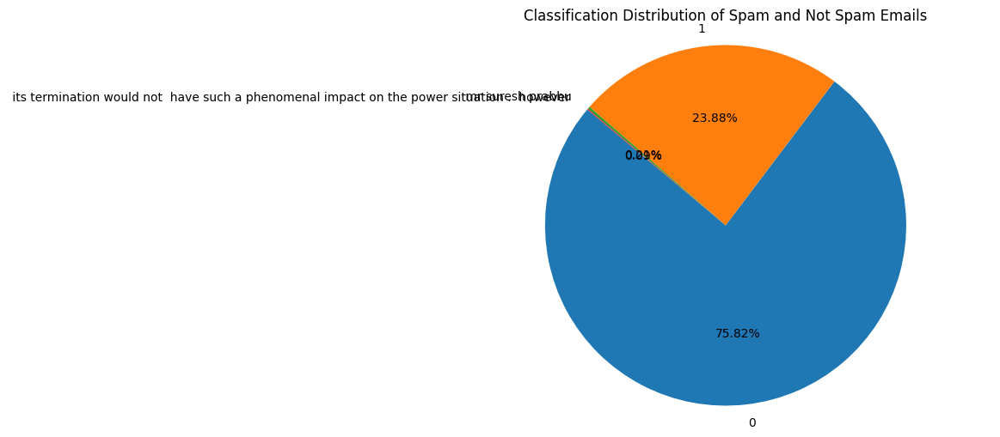

In [28]:
# Count the number of spam and not spam emails
spam_counts = dataset['nb_pred'].value_counts()

# Plotting the pie chart
plt.figure(figsize=(8, 6))
plt.pie(spam_counts, labels=spam_counts.index, autopct='%1.2f%%', startangle=140)
plt.title('Classification Distribution of Spam and Not Spam Emails')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()

Confusion Matrix:
[[  0   0   0   0]
 [  0   0   0   0]
 [  1   1 848   6]
 [  0   0  10 280]]


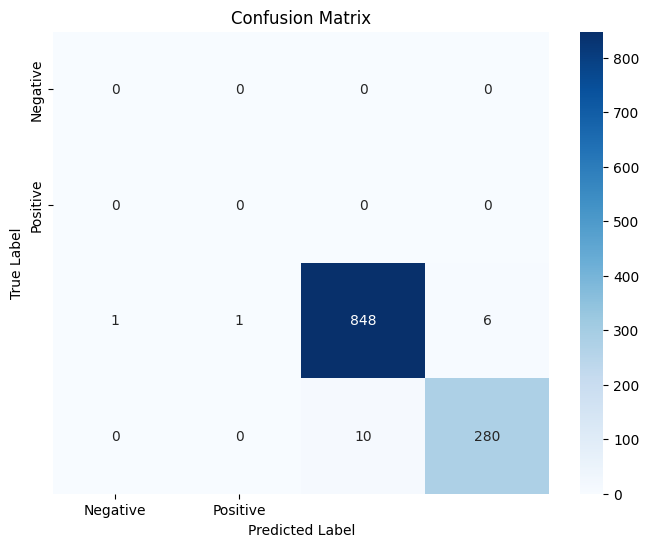

In [29]:
# confusion matrix calculation
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Plotting confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [30]:
#calculating accuracy of the model based on the confusion matrix
#accuracy = (total pos. + total neg.) / total data points
accuracy_value = (848+200)/(848+200+10+6) 
print('Accuracy Score: ',accuracy_value)
print('Accuracy Percentage: ',accuracy_value*100,'%')


Accuracy Score:  0.9849624060150376
Accuracy Percentage:  98.49624060150376 %


In [31]:
spam_counts = dataset['nb_pred'].value_counts()
spam_counts

nb_pred
0                                                                                               4343
1                                                                                               1368
 mr suresh prabhu                                                                                 12
 its termination would not  have such a phenomenal impact on the power situation .  however        5
Name: count, dtype: int64